<a href="https://colab.research.google.com/github/comojin1994/Deep_Learning_Study/blob/master/Kaggle/Global_Wheat_Detection/Data_Augmentation_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import os
import ast
from collections import namedtuple

import numpy as np
import pandas as pd

from tqdm import tqdm
from PIL import Image

import joblib
from joblib import Parallel, delayed

import cv2
import albumentations
from albumentations.pytorch.transforms import ToTensorV2
from albumentations.core.transforms_interface import DualTransform
from albumentations.augmentations.bbox_utils import denormalize_bbox, normalize_bbox

from sklearn.model_selection import StratifiedKFold

import torch
from torch.utils.data import DataLoader, Dataset
import torch.utils.data as data_utils

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.image import imsave

In [0]:
BASE_DIR = '../input/global-wheat-detection/'
WORK_DIR = './'
BATCH_SIZE = 16

np.random.seed(1996)

In [0]:
train_df = pd.read_csv(os.path.join(BASE_DIR, 'train.csv'))

train_df[['x_min', 'y_min', 'width', 'height']] = pd.DataFrame([ast.literal_eval(x) for x in train_df.bbox.tolist()], index = train_df.index)
train_df = train_df[['image_id', 'bbox', 'source', 'x_min', 'y_min', 'width', 'height']]
train_df['area'] = train_df['width'] * train_df['height']
train_df['x_max'] = train_df['x_min'] + train_df['width']
train_df['y_max'] = train_df['y_min'] + train_df['height']
train_df = train_df.drop(['bbox'], axis=1)
train_df = train_df[['image_id', 'x_min', 'y_min', 'x_max', 'y_max', 'width', 'height', 'area', 'source']]

train_df = train_df[train_df['area'] < 100000]

train_df.head()

,image_id,x_min,y_min,x_max,y_max,width,height,area,source
0,b6ab77fd7,834.0,222.0,890.0,258.0,56.0,36.0,2016.0,usask_1
1,b6ab77fd7,226.0,548.0,356.0,606.0,130.0,58.0,7540.0,usask_1
2,b6ab77fd7,377.0,504.0,451.0,664.0,74.0,160.0,11840.0,usask_1
3,b6ab77fd7,834.0,95.0,943.0,202.0,109.0,107.0,11663.0,usask_1
4,b6ab77fd7,26.0,144.0,150.0,261.0,124.0,117.0,14508.0,usask_1


In [0]:
print(train_df.shape)
image_ids = train_df['image_id'].unique()
print(f'Total number of training images: {len(image_ids)}')

(147769, 9)
Total number of training images: 3373


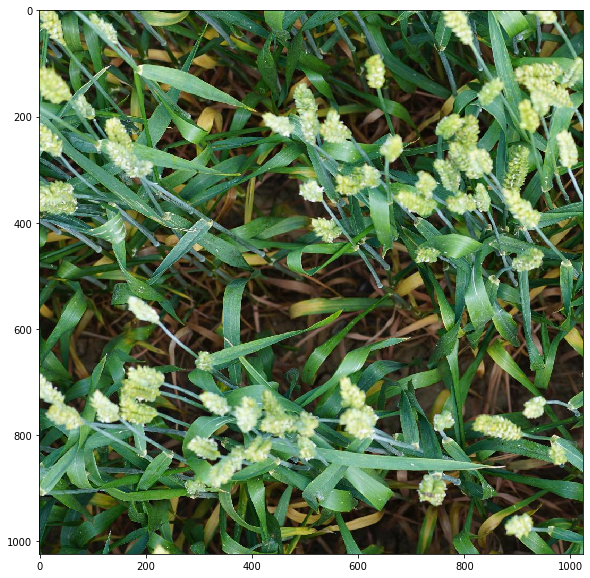

In [0]:
image_id = 'c14c1e300'
image = cv2.imread(os.path.join(BASE_DIR, 'train', f'{image_id}.jpg'), cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
image = image/255.
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.show()

In [0]:
pascal_voc_boxes = train_df[train_df['image_id'] == image_id][['x_min', 'y_min', 'x_max', 'y_max']].astype(np.int32).values
coco_boxes = train_df[train_df['image_id'] == image_id][['x_min', 'y_min', 'width', 'height']].astype(np.int32).values
assert(len(pascal_voc_boxes) == len(coco_boxes))
labels = np.ones((len(pascal_voc_boxes), ))

In [0]:
def get_bbox(bboxes, col, color='while', bbox_format='pascal_voc'):
    
    for i in range(len(bboxes)):
        if bbox_format == 'pascal_voc':
            rect = patches.Rectangle(
                (bboxes[i][0], bboxes[i][1]),
                bboxes[i][2] - bboxes[i][0],
                bboxes[i][3] - bboxes[i][1],
                linewidth = 2,
                edgecolor = color,
                facecolor = 'none'
            )
            
        elif bbox_format == 'coco':
            rect = patches.Rectangle(
                (bboxes[i][0], bboxes[i][1]),
                bboxes[i][2],
                bboxes[i][3],
                linewidth = 2,
                edgecolor = color,
                facecolor = 'none'
            )
            
        else: print('input Error')
        
        col.add_patch(rect)

In [0]:
aug = albumentations.Compose([
    albumentations.Resize(512, 512),
    albumentations.VerticalFlip(1),
], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

In [0]:
aug_result = aug(image=image, bboxes=pascal_voc_boxes, labels=labels)

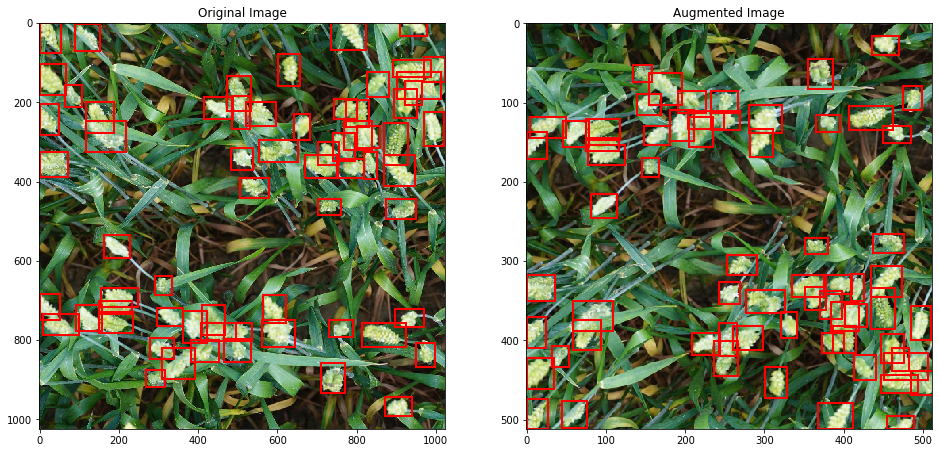

In [0]:
fig, ax = plt.subplots(1, 2, figsize=(16, 16))
get_bbox(pascal_voc_boxes, ax[0], color='red')
ax[0].title.set_text('Original Image')
ax[0].imshow(image)

get_bbox(aug_result['bboxes'], ax[1], color='red')
ax[1].title.set_text('Augmented Image')
ax[1].imshow(aug_result['image'])

plt.show()

In [0]:
aug = albumentations.Compose([
    albumentations.Resize(512, 512),
    albumentations.VerticalFlip(1),
    albumentations.Blur(p=1)
], bbox_params = {'format': 'coco', 'label_fields': ['labels']})

In [0]:
aug_result = aug(image=image, bboxes=coco_boxes, labels=labels)

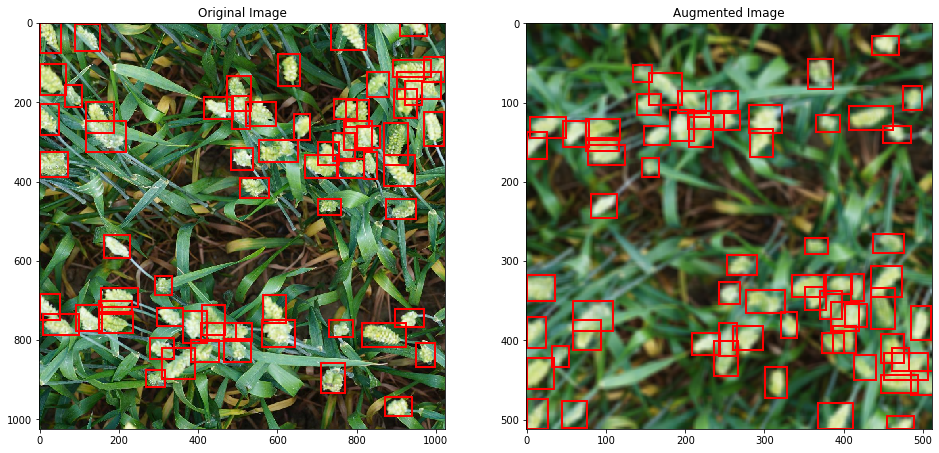

In [0]:
fig, ax = plt.subplots(1, 2, figsize=(16, 16))
get_bbox(coco_boxes, ax[0], color='red', bbox_format='coco')
ax[0].title.set_text('Original Image')
ax[0].imshow(image)

get_bbox(aug_result['bboxes'], ax[1], color='red', bbox_format='coco')
ax[1].title.set_text('Augmented Image')
ax[1].imshow(aug_result['image'])

plt.show()

# Custum Albumentation

In [0]:
class CustomCutout(DualTransform):
    def __init__(self, fill_value=0, bbox_removal_threshold=0.5, min_cutout_size=192, max_cutout_size=512,
        always_apply=False, p=0.5):
        super(CustomCutout, self).__init__(always_apply, p)
        
        self.fill_value = fill_value
        self.bbox_removal_threshold = bbox_removal_threshold
        self.min_cutout_size = min_cutout_size
        self.max_cutout_size = max_cutout_size
        
    def _get_cutout_position(self, img_height, img_width, cutout_size):
        position = namedtuple('Point', 'x y')
        return position(
            np.random.randint(0, img_width - cutout_size + 1),
            np.random.randint(0, img_height - cutout_size + 1)
        )
    
    def _get_cutout(self, img_height, img_width):
        cutout_size = np.random.randint(self.min_cutout_size, self.max_cutout_size + 1)
        cutout_position = self._get_cutout_position(img_height, img_width, cutout_size)
        return np.full((cutout_size, cutout_size, 3), self.fill_value), cutout_size, cutout_position
    
    def apply(self, image, **params):
        image = image.copy()
        self.img_height, self.img_width, _ = image.shape
        cutout_arr, cutout_size, cutout_position = self._get_cutout(self.img_height, self.img_width)
        
        self.image = image
        self.cutout_pos = cutout_position
        self.cutout_size = cutout_size
        
        image[self.cutout_pos.y:self.cutout_pos.y+self.cutout_size, self.cutout_pos.x:self.cutout_pos.x+self.cutout_size, :] = cutout_arr
        return image
    
    def apply_to_bbox(self, bbox, **params):
        bbox = denormalize_bbox(bbox, self.img_height, self.img_width)
        x_min, y_min, x_max, y_max = tuple(map(int, bbox))
        
        bbox_size = (x_max - x_min) * (y_max - y_min)
        overlapping_size = np.sum(
            (self.image[y_min:y_max, x_min:x_max, 0] == self.fill_value) &
            (self.image[y_min:y_max, x_min:x_max, 1] == self.fill_value) &
            (self.image[y_min:y_max, x_min:x_max, 2] == self.fill_value)
        )
        
        if overlapping_size / bbox_size > self.bbox_removal_threshold:
            return normalize_bbox((0, 0, 0, 0), self.img_height, self.img_width)
        
        return normalize_bbox(bbox, self.img_height, self.img_width)
    
    def get_transform_init_arg_names(self):
        return ('fill_value', 'bbox_removal_threshold', 'min_cutout_size', 'max_cutout_size', 'always_apply', 'p')

In [0]:
augmentation = albumentations.Compose([
    CustomCutout(p=1),
    albumentations.Flip(always_apply=True),
    albumentations.OneOf([
        albumentations.Blur(p=0.50),
        albumentations.GaussNoise(var_limit=5.0 / 255.0, p=0.50)
    ], p=1)
], bbox_params = {
    'format': 'pascal_voc',
    'label_fields': ['labels']
})

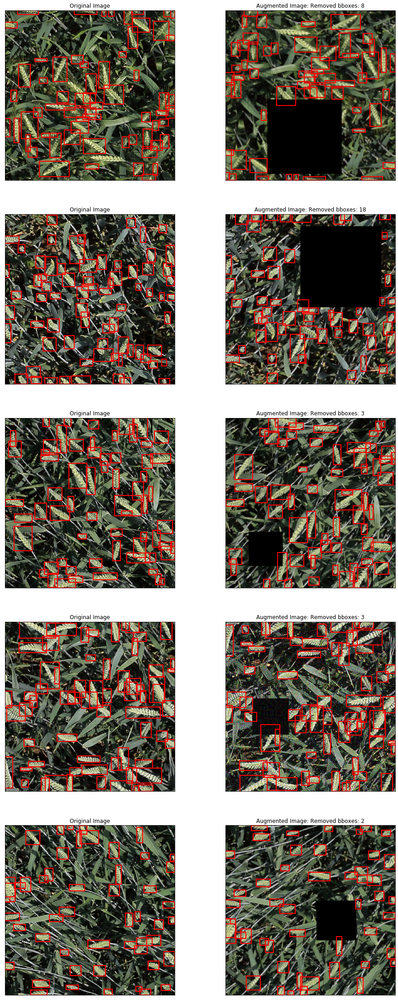

In [0]:
num_images = 5
rand_start = np.random.randint(0, len(image_ids) - 5)
fig, ax = plt.subplots(num_images, 2, figsize=(16, 40))

for index, image_id in enumerate(image_ids[rand_start : rand_start + num_images]):
    image = cv2.imread(os.path.join(BASE_DIR, 'train', f'{image_id}.jpg'), cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.
    
    bboxes = train_df[train_df['image_id'] == image_id][['x_min', 'y_min', 'x_max', 'y_max']].astype(np.int32).values
    labels = np.ones((len(bboxes), ))
    aug_result = augmentation(image=image, bboxes=bboxes, labels=labels)
    
    get_bbox(bboxes, ax[index][0], color='red')
    ax[index][0].grid(False)
    ax[index][0].set_xticks([])
    ax[index][0].set_yticks([])
    ax[index][0].title.set_text('Original Image')
    ax[index][0].imshow(image)
    
    get_bbox(aug_result['bboxes'], ax[index][1], color='red')
    ax[index][1].grid(False)
    ax[index][1].set_xticks([])
    ax[index][1].set_yticks([])
    ax[index][1].title.set_text(f'Augmented Image: Removed bboxes: {len(bboxes) - len(aug_result["bboxes"])}')
    ax[index][1].imshow(aug_result['image'])
plt.show()    

# Mixup

In [0]:
def mixup(images, bboxes, areas, alpha=1.0):
    indices = torch.randperm(len(images))
    shuffled_images = images[indices]
    shuffled_bboxes = bboxes[indices]
    shuffled_areas = areas[indices]
    
    lam = np.clip(np.random.beta(alpha, alpha), 0.4, 0.6)
    print(f'lambda: {lam}')
    
    mixedup_images = lam * images + (1 - lam) * shuffled_images
    
    mixedup_bboxes, mixedup_areas = [], []
    for bbox, s_bbox, area, s_area in zip(bboxes, shuffled_bboxes, areas, shuffled_areas):
        mixedup_bboxes.append(bbox + s_bbox)
        mixedup_areas.append(area + s_area)
        
    return mixedup_images, mixedup_bboxes, mixedup_areas, indices.numpy()

In [0]:
class WheatDataset(Dataset):
    
    def __init__(self, df):
        self.df = df
        self.image_ids = self.df['image_id'].unique()

    def __len__(self):
        return len(self.image_ids)
    
    def __getitem__(self, index):
        image_id = self.image_ids[index]
        image = cv2.imread(os.path.join(BASE_DIR, 'train', f'{image_id}.jpg'), cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0  # Normalize
        
        # Get bbox coordinates for each wheat head(s)
        bboxes_df = self.df[self.df['image_id'] == image_id]
        boxes, areas = [], []
        n_objects = len(bboxes_df)  # Number of wheat heads in the given image

        for i in range(n_objects):
            x_min = bboxes_df.iloc[i]['x_min']
            x_max = bboxes_df.iloc[i]['x_max']
            y_min = bboxes_df.iloc[i]['y_min']
            y_max = bboxes_df.iloc[i]['y_max']

            boxes.append([x_min, y_min, x_max, y_max])
            areas.append(bboxes_df.iloc[i]['area'])

        return {
            'image_id': image_id,
            'image': image,
            'boxes': boxes,
            'area': areas,
        }

In [0]:
def collate_fn(batch):
    images, bboxes, areas, image_ids = ([] for _ in range(4))
    for data in batch:
        images.append(data['image'])
        bboxes.append(data['boxes'])
        areas.append(data['area'])
        image_ids.append(data['image_id'])

    return np.array(images), np.array(bboxes), np.array(areas), np.array(image_ids)

In [0]:
train_dataset = WheatDataset(train_df)
train_loader = data_utils.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate_fn)

In [0]:
images, bboxes, areas, image_ids = next(iter(train_loader))
aug_images, aug_bboxes, aug_areas, aug_indices = mixup(images, bboxes, areas)

lambda: 0.4


In [0]:
def read_image(image_id):
    image = cv2.imread(os.path.join(BASE_DIR, 'train', f'{image_id}.jpg'), cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.
    return image

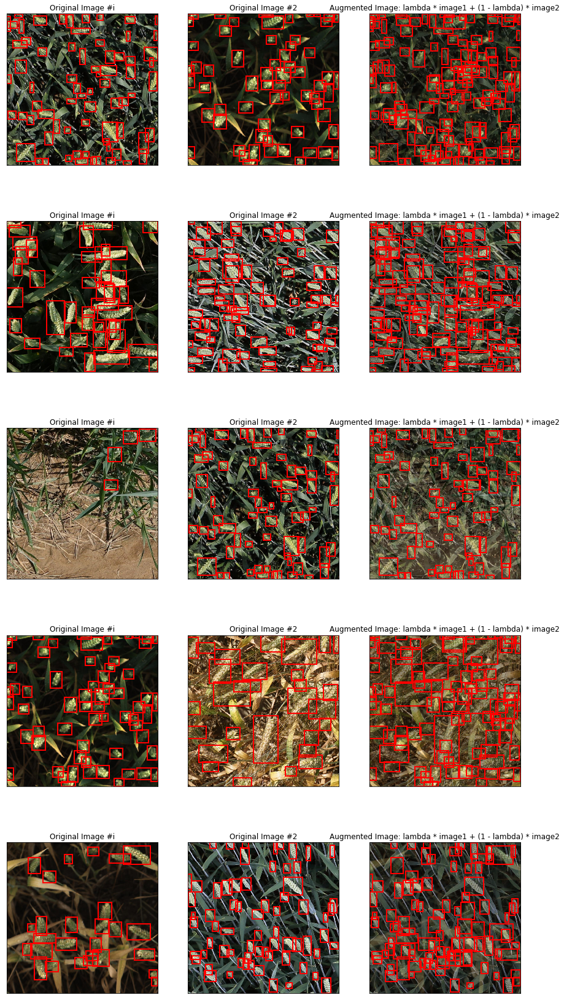

In [0]:
fig, ax = plt.subplots(5, 3, figsize=(15, 30))
for index in range(5):
    image_id = image_ids[index]
    image = read_image(image_id)
    
    get_bbox(bboxes[index], ax[index][0], color='red')
    ax[index][0].grid(False)
    ax[index][0].set_xticks([])
    ax[index][0].set_yticks([])
    ax[index][0].title.set_text('Original Image #i')
    ax[index][0].imshow(image)
    
    image_id = image_ids[aug_indices[index]]
    image = read_image(image_id)
    
    get_bbox(bboxes[aug_indices[index]], ax[index][1], color='red')
    ax[index][1].grid(False)
    ax[index][1].set_xticks([])
    ax[index][1].set_yticks([])
    ax[index][1].title.set_text('Original Image #2')
    ax[index][1].imshow(image)
    
    get_bbox(aug_bboxes[index], ax[index][2], color='red')
    ax[index][2].grid(False)
    ax[index][2].set_xticks([])
    ax[index][2].set_yticks([])
    ax[index][2].title.set_text(f'Augmented Image: lambda * image1 + (1 - lambda) * image2')
    ax[index][2].imshow(aug_images[index])
plt.show()

# Make Datasets

In [0]:
augmentation = albumentations.Compose([
    albumentations.Flip(p=0.6),
    albumentations.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.6),
    albumentations.HueSaturationValue(p=0.6),
    albumentations.OneOf([
        albumentations.Blur(p=0.50),
        albumentations.GaussNoise(var_limit=5.0 / 255.0, p=0.50)
    ], p=0.6)
], bbox_params = {
    'format': 'pascal_voc',
    'label_fields': ['labels']
})

In [0]:
if not os.path.isdir('train'):
    os.mkdir('train')

In [0]:
def create_dataset(index, image_id):
    image = cv2.imread(os.path.join(BASE_DIR, 'train', f'{image_id}.jpg'), cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    bboxes = train_df[train_df['image_id'] == image_id][['x_min', 'y_min', 'x_max', 'y_max']].astype(np.int32).values
    source = train_df[train_df['image_id'] == image_id]['source'].unique()[0]
    labels = np.ones((len(bboxes), ))
    aug_result = augmentation(image=image, bboxes=bboxes, labels=labels)

    aug_image = aug_result['image']
    aug_bboxes = aug_result['bboxes']
    
    Image.fromarray(image).save(os.path.join(WORK_DIR, 'train', f'{image_id}.jpg'))
    Image.fromarray(aug_image).save(os.path.join(WORK_DIR, 'train', f'{image_id}_aug.jpg'))

    image_metadata = []
    for bbox in aug_bboxes:
        bbox = tuple(map(int, bbox))
        image_metadata.append({
            'image_id': f'{image_id}_aug',
            'x_min': bbox[0],
            'y_min': bbox[1],
            'x_max': bbox[2],
            'y_max': bbox[3],
            'width': bbox[2] - bbox[0],
            'height': bbox[3] - bbox[1],
            'area': (bbox[2] - bbox[0]) * (bbox[3] - bbox[1]),
            'source': source
        })
    return image_metadata

In [0]:
image_metadata = Parallel(n_jobs=8)(delayed(create_dataset)(index, image_id) for index, image_id in tqdm(enumerate(image_ids), total=len(image_ids)))
image_metadata = [item for sublist in image_metadata for item in sublist]

100%|██████████| 16/16 [00:00<00:00, 81.21it/s]


In [0]:
aug_train_df = pd.DataFrame(image_metadata)
aug_train_df.head()

,image_id,x_min,y_min,x_max,y_max,width,height,area,source
0,70083c73e_aug,812,585,869,671,57,86,4902,ethz_1
1,70083c73e_aug,0,904,27,1005,27,101,2727,ethz_1
2,70083c73e_aug,260,138,311,224,51,86,4386,ethz_1
3,70083c73e_aug,940,156,999,248,59,92,5428,ethz_1
4,70083c73e_aug,933,708,1024,796,91,88,8008,ethz_1


In [0]:
print(aug_train_df.shape)

(800, 9)


In [0]:
train_df = pd.concat([train_df, aug_train_df]).reset_index(drop=True)
train_df.head()

,image_id,x_min,y_min,x_max,y_max,width,height,area,source
0,b6ab77fd7,834.0,222.0,890.0,258.0,56.0,36.0,2016.0,usask_1
1,b6ab77fd7,226.0,548.0,356.0,606.0,130.0,58.0,7540.0,usask_1
2,b6ab77fd7,377.0,504.0,451.0,664.0,74.0,160.0,11840.0,usask_1
3,b6ab77fd7,834.0,95.0,943.0,202.0,109.0,107.0,11663.0,usask_1
4,b6ab77fd7,26.0,144.0,150.0,261.0,124.0,117.0,14508.0,usask_1


In [0]:
train_df.shape

(148569, 9)

In [0]:
train_df.to_csv('train_csv', index=False)